In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
import numpy as np
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import pathlib

In [4]:
dataset_directory = pathlib.Path("/kaggle/input/mushrooms-classification-common-genuss-images/Mushrooms")
image_count = len(list(dataset_directory.glob('*/*.jpg')))
print(f"Total number of images: {image_count}")

Total number of images: 6714


In [5]:
type_of_mushroom = len(list(dataset_directory.glob('*')))
print(f"Types of mushroom: {type_of_mushroom}")

Types of mushroom: 9


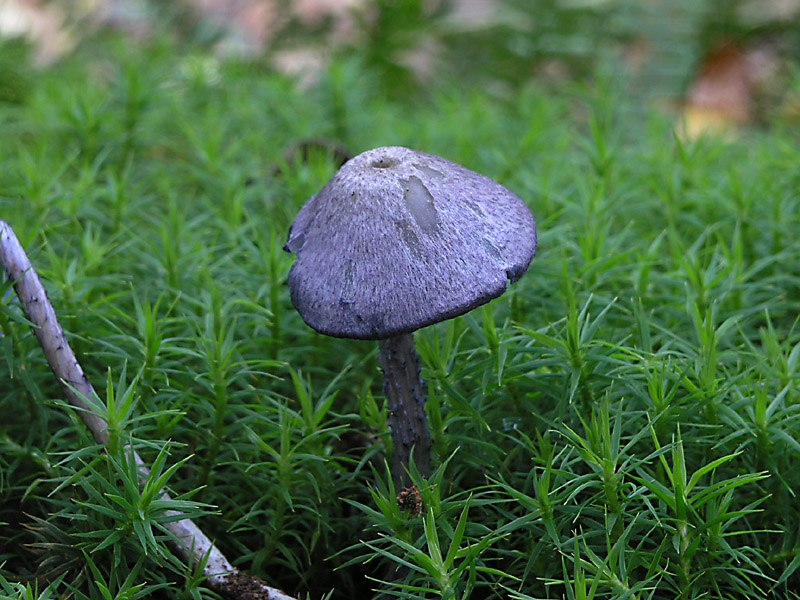

In [6]:
Entoloma = list(dataset_directory.glob('Entoloma/*.jpg'))
PIL.Image.open(str(Entoloma[0]))

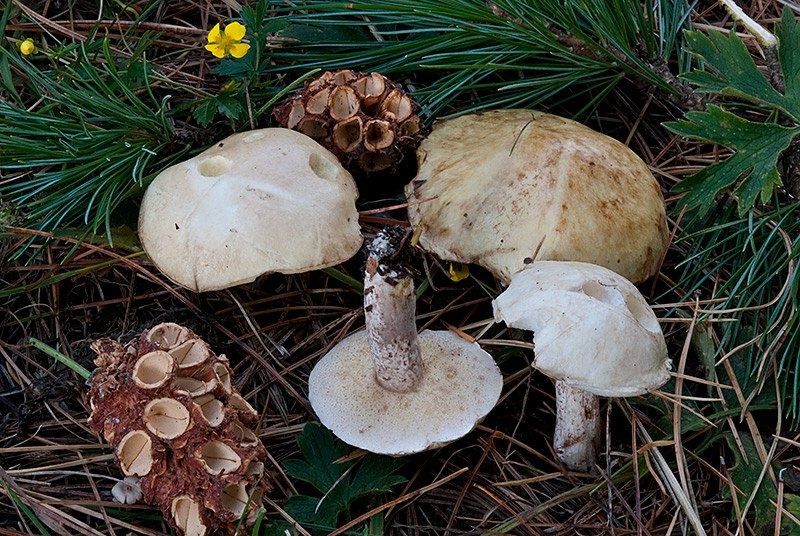

In [7]:
Suillus = list(dataset_directory.glob('Suillus/*.jpg'))
PIL.Image.open(str(Suillus[0]))

In [8]:
batch_size = 16
img_height = 224
img_width = 224

In [9]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_directory,
    labels="inferred",
    label_mode="int",
    validation_split=0.2,
    subset="training",
    seed=123,
    shuffle="True",
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 6714 files belonging to 9 classes.
Using 5372 files for training.


In [10]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_directory,
    labels="inferred",
    label_mode="int",
    validation_split=0.2,
    subset="validation",
    seed=123,
    shuffle="True",
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 6714 files belonging to 9 classes.
Using 1342 files for validation.


In [11]:
class_names = train_ds.class_names
print(class_names)

['Agaricus', 'Amanita', 'Boletus', 'Cortinarius', 'Entoloma', 'Hygrocybe', 'Lactarius', 'Russula', 'Suillus']


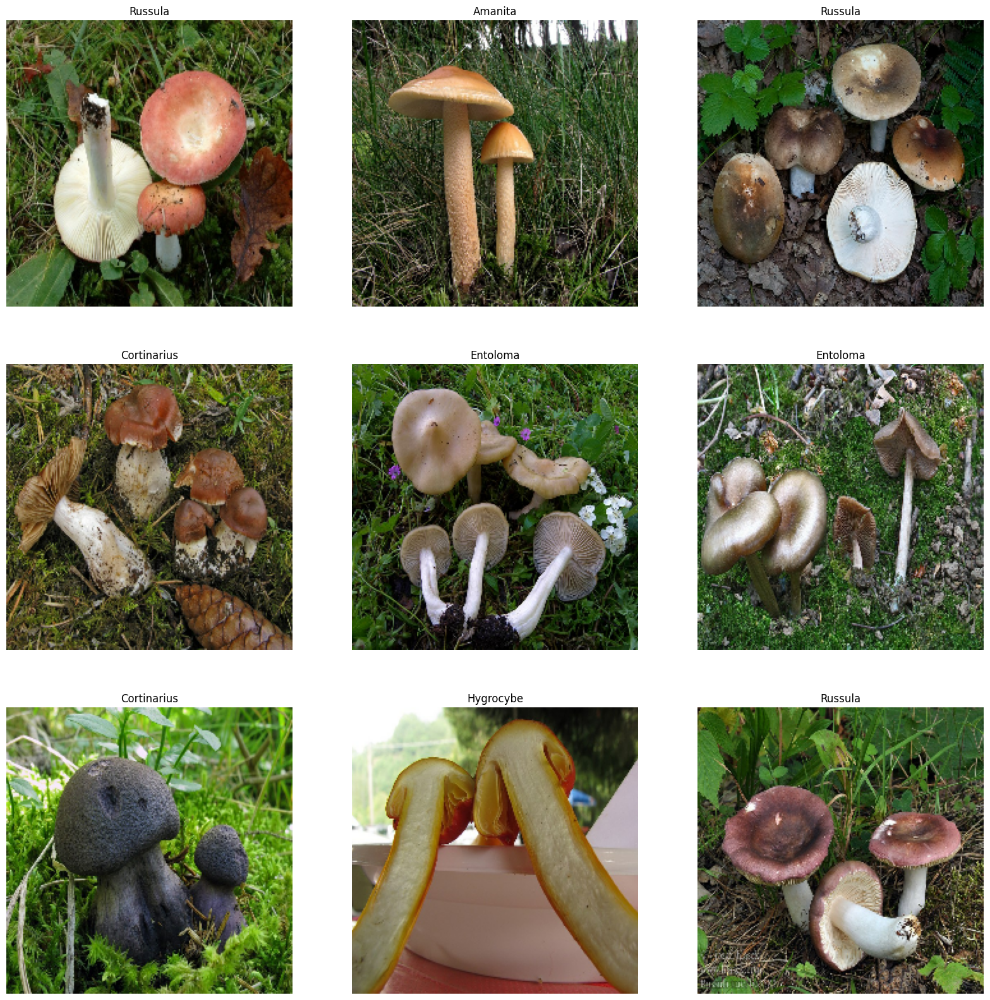

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [13]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(16, 224, 224, 3)
(16,)


In [14]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [15]:
normalization_layer = layers.Rescaling(1./255)

In [17]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
print(np.min(first_image), np.max(first_image))

0.0 0.98557436


In [18]:
data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical",
                        input_shape=(img_height,
                                    img_width,
                                    3)),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2),
    ])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


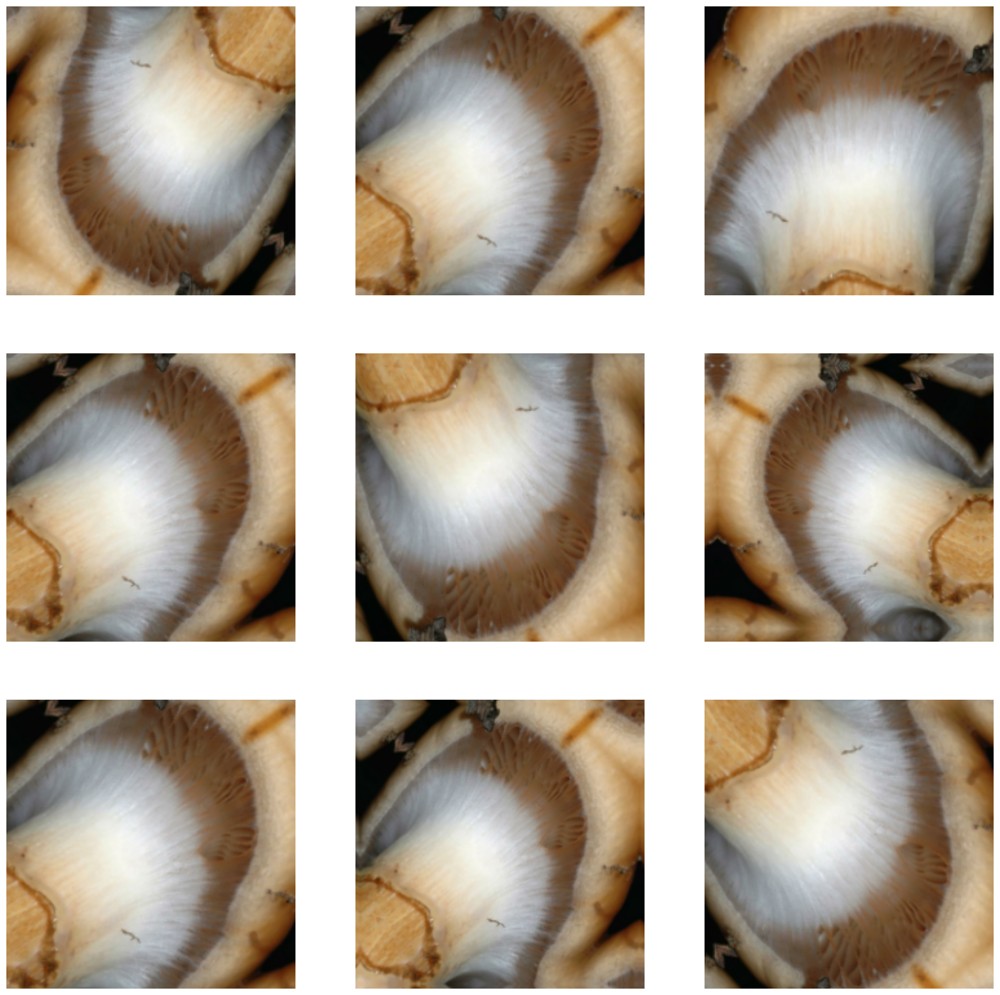

In [19]:
plt.figure(figsize=(20, 20))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [20]:
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

num_classes = len(class_names)

resnet_model = ResNet50(weights="imagenet")

last_layer = resnet_model.get_layer("avg_pool")
resnet_layers = Model(inputs=resnet_model.inputs, outputs=last_layer.output)

model = Sequential()
model.add(data_augmentation)
model.add(resnet_layers)
model.add(Dense(num_classes))

model.layers[0].trainable=False

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [21]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [22]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_2 (Functional)       │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [23]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

checkpoint = ModelCheckpoint(
    "Model(ResNet50).keras",
    monitor='val_accuracy',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
    save_freq="epoch"
)
early = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0,
    patience=40,
    verbose=1,
    mode='auto'
)
reduce_lr = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.1,
    mode='max',
    cooldown=2,
    patience=2,
    min_lr=0
)


In [25]:
epochs = 20
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[checkpoint, early, reduce_lr],
)

Epoch 1/20
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.6176 - loss: 1.1256

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 1: val_accuracy improved from -inf to 0.70417, saving model to Model(ResNet50).keras
336/336 ━━━━━━━━━━━━━━━━━━━━ 106s 316ms/step - accuracy: 0.6177 - loss: 1.1251 - val_accuracy: 0.7042 - val_loss: 0.9395 - learning_rate: 1.0000e-04
Epoch 2/20
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.7865 - loss: 0.6372
Epoch 2: val_accuracy improved from 0.70417 to 0.74665, saving model to Model(ResNet50).keras
336/336 ━━━━━━━━━━━━━━━━━━━━ 104s 311ms/step - accuracy: 0.7865 - loss: 0.6372 - val_accuracy: 0.7466 - val_loss: 0.8493 - learning_rate: 1.0000e-04
Epoch 3/20
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.8417 - loss: 0.4735
Epoch 3: val_accuracy did not improve from 0.74665
336/336 ━━━━━━━━━━━━━━━━━━━━ 103s 306ms/step - accuracy: 0.8417 - loss: 0.4735 - val_accuracy: 0.6088 - val_loss: 1.7815 - learning_rate: 1.0000e-04
Epoch 4/20
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.8789 - loss: 0.3646
Epoch 4: val_accuracy did not improve from 0.74665
3

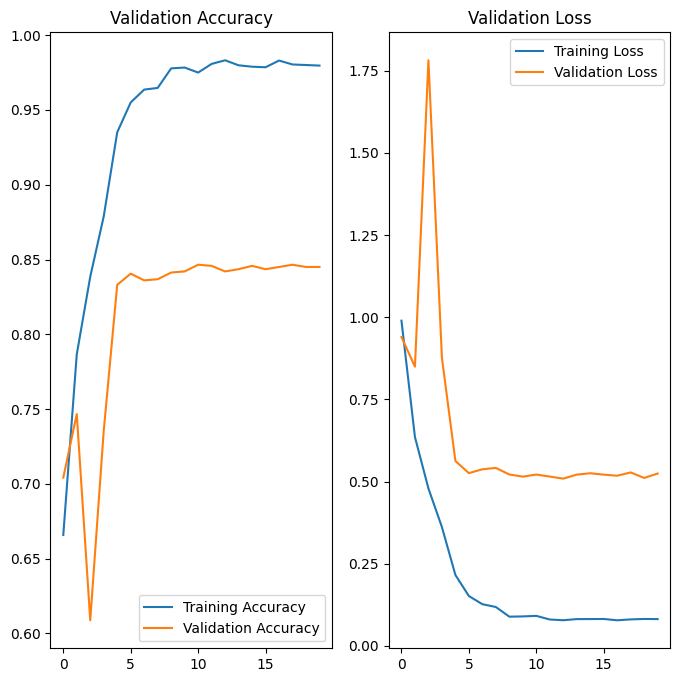

In [27]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training Accuracy')
plt.title('Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training Loss')
plt.title('Validation Loss')
plt.show()

In [45]:
model.save_weights("/kaggle/working/model.weights.h5")